In [1]:
%load_ext lab_black

from drnb.experiment import Experiment

Dmitry Kobak noted in a tweet that [t-SNE is superior to UMAP in recall of nearest neighbors](https://twitter.com/hippopedoid/status/1646812015661334528). The specifics was about document embedding, but I had observed something similar across multiple datasets when documenting [uwot](https://jlmelville.github.io/uwot/umap-examples.html). But I thought there was a bug in my nearest neighbor calculation code and so removed the values in late 2018, promising myself I would get around to working out if there was an error and fixing it. Better late than never here is an evaluation of nearest neigbor recall.

## Datasets

I chose 20 datasets that vary in size, dimensionality and domain:

In [2]:
datasets = [
    "iris",
    "penguins",
    "s1k",
    "olivetti",
    "frey",
    "coil20",
    "mnist",
    "fashion",
    "kuzushiji",
    "isoswiss",
    "scurvehole",
    "mammoth",
    "macosko2015",
    "tasic2018",
    "lamanno2020",
    "onet271",
    "avonet",
    "ng20",
    "iclr",
    "galaxy10sdss",
]
len(datasets)

20

## Evaluation Metrics

I'm not really that interested in global evaluation but we may as well also look at random triplet evaluation (is the relative ordering of distances for three points preserved in the embedded space).

For recall, I will look at preservation of 15, 50 and 150 nearest neighbors.

In [3]:
eval_metrics = ["rte", ("nnp", dict(n_neighbors=[15, 50, 150]))]

## Create the Experiment

The `Experiment` class is a convenient way for me to evaluate and store results for different embedding methods on different datasets:

In [4]:
recall_exp = Experiment(name="Recall", evaluations=eval_metrics)

In [5]:
recall_exp.add_datasets(datasets)

## Methods to Compare

Let's start with t-SNE and UMAP with (mostly) their default parameters. For t-SNE this is [OpenTSNE](https://github.com/pavlin-policar/openTSNE), so the initialization is via PCA rather than the random initialization used by many other packages (and used in the t-SNE papers). No attempt at this point will be made to equalize the number of iterations or the number of neighbors used internally. The document embedding work uses longer t-SNE optimization and anneals the early exaggeration step but Dmitry told me in an email that he doesn't think it makes a massive different to recall so let's not over-complicate things. Also, I will look at PCA as a baseline. 

### One Non-Default Setting

There is one way in which I will deviate from default settings. All the datasets below have had their exact nearest neighbors found using FAISS ahead of time. This saves time when running t-SNE and UMAP and also removes one way variations in recall quality could enter the assessment. 

In [6]:
recall_exp.add_method("pca")

In [7]:
recall_exp.add_method("tsne")

In [8]:
recall_exp.add_method("umap")

Off we go. t-SNE generates a lot of output, so the output of the cell below is hidden. Also, each dataset and method is run sequentially so this could take a while to complete.

In [9]:
recall_exp.run()

[15:18:05] INFO     Running pca on iris                                                            ]8;id=133433;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=694127;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:18:06] WARNING  151 nearest neighbors requested but only 150 items are available                  ]8;id=275269;file:///home/james/dev/drnb/src/drnb/eval/nbrpres.py\nbrpres.py]8;;\:]8;id=677291;file:///home/james/dev/drnb/src/drnb/eval/nbrpres.py#56\56]8;;\

           INFO     Loading faiss with AVX2 support.                                                   ]8;id=13602;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/faiss/loader.py\loader.py]8;;\:]8;id=889799;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/faiss/loader.py#54\54]8;;\

           INFO     Could not load library with AVX2 support due to:                                   ]8;id=722935;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/faiss/loader.py\loader.py]8;;\:]8;id=362184;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/faiss/loader.py#58\58]8;;\
                    ModuleNotFoundError("No module named 'faiss.swigfaiss_avx2'")                                  

           INFO     Loading faiss.                                                                     ]8;id=854360;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/faiss/loader.py\loader.py]8;;\:]8;id=634988;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/faiss/loader.py#64\64]8;;\

           INFO     Successfully loaded faiss.                                                         ]8;id=456724;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/faiss/loader.py\loader.py]8;;\:]8;id=955784;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/faiss/loader.py#66\66]8;;\

[15:18:07] INFO     Running pca on penguins                                                        ]8;id=995643;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=301762;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

           INFO     Running pca on s1k                                                             ]8;id=775621;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=749489;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:18:08] INFO     Running pca on olivetti                                                        ]8;id=722404;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=919461;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:18:09] INFO     Running pca on frey                                                            ]8;id=837389;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=369838;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

           INFO     Running pca on coil20                                                          ]8;id=765185;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=411725;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:18:11] INFO     Running pca on mnist                                                           ]8;id=89716;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=552190;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:18:20] INFO     Running pca on fashion                                                         ]8;id=60085;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=72989;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:18:30] INFO     Running pca on kuzushiji                                                       ]8;id=798177;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=150627;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:18:39] INFO     Running pca on isoswiss                                                        ]8;id=625772;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=457391;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:18:41] INFO     Running pca on scurvehole                                                      ]8;id=573288;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=817647;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:18:42] INFO     Running pca on mammoth                                                         ]8;id=883181;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=534308;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:18:48] INFO     Running pca on macosko2015                                                     ]8;id=582617;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=329572;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:18:57] INFO     Running pca on tasic2018                                                       ]8;id=746570;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=939379;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:19:02] INFO     Running pca on lamanno2020                                                     ]8;id=442289;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=342894;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

           INFO     Running pca on onet271                                                         ]8;id=440893;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=444543;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:19:03] INFO     Running pca on avonet                                                          ]8;id=996284;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=576887;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:19:04] INFO     Running pca on ng20                                                            ]8;id=862535;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=163627;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:19:08] INFO     Running pca on iclr                                                            ]8;id=835616;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=650330;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:19:11] INFO     Running pca on galaxy10sdss                                                    ]8;id=500778;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=843556;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:19:25] INFO     Running tsne on iris                                                           ]8;id=426186;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=337900;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

           INFO     KNN index provided. Ignoring KNN-related parameters.                            ]8;id=100761;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py\affinity.py]8;;\:]8;id=424149;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py#186\186]8;;\

           INFO     Precomputed affinities provided. Ignoring perplexity-related parameters.           ]8;id=334750;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=504355;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1321\1321]8;;\

           INFO     Precomputed initialization provided. Ignoring initalization-related parameters.    ]8;id=955488;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=317433;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1329\1329]8;;\

           INFO     Automatically determined negative gradient method `bh`                               ]8;id=530279;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=860855;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

           INFO     Automatically determined negative gradient method `bh`                               ]8;id=994293;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=546119;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:19:26] WARNING  151 nearest neighbors requested but only 150 items are available                  ]8;id=162938;file:///home/james/dev/drnb/src/drnb/eval/nbrpres.py\nbrpres.py]8;;\:]8;id=7944;file:///home/james/dev/drnb/src/drnb/eval/nbrpres.py#56\56]8;;\

           INFO     Running tsne on penguins                                                       ]8;id=562994;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=931412;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:19:27] INFO     KNN index provided. Ignoring KNN-related parameters.                            ]8;id=47540;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py\affinity.py]8;;\:]8;id=209881;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py#186\186]8;;\

           INFO     Precomputed affinities provided. Ignoring perplexity-related parameters.           ]8;id=410585;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=655629;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1321\1321]8;;\

           INFO     Precomputed initialization provided. Ignoring initalization-related parameters.    ]8;id=292399;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=726975;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1329\1329]8;;\

           INFO     Automatically determined negative gradient method `bh`                               ]8;id=971590;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=817233;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

           INFO     Automatically determined negative gradient method `bh`                               ]8;id=127731;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=529013;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:19:28] INFO     Running tsne on s1k                                                            ]8;id=247052;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=89054;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

           INFO     KNN index provided. Ignoring KNN-related parameters.                            ]8;id=85004;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py\affinity.py]8;;\:]8;id=334755;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py#186\186]8;;\

           INFO     Precomputed affinities provided. Ignoring perplexity-related parameters.           ]8;id=532844;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=654944;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1321\1321]8;;\

           INFO     Precomputed initialization provided. Ignoring initalization-related parameters.    ]8;id=489225;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=556440;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1329\1329]8;;\

           INFO     Automatically determined negative gradient method `bh`                               ]8;id=122209;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=331942;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

           INFO     Automatically determined negative gradient method `bh`                               ]8;id=565414;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=627990;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:19:31] INFO     Running tsne on olivetti                                                       ]8;id=579297;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=514494;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

           INFO     KNN index provided. Ignoring KNN-related parameters.                            ]8;id=153383;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py\affinity.py]8;;\:]8;id=4405;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py#186\186]8;;\

           INFO     Precomputed affinities provided. Ignoring perplexity-related parameters.           ]8;id=846469;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=141553;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1321\1321]8;;\

           INFO     Precomputed initialization provided. Ignoring initalization-related parameters.    ]8;id=141499;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=732077;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1329\1329]8;;\

           INFO     Automatically determined negative gradient method `bh`                               ]8;id=857824;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=94335;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:19:32] INFO     Automatically determined negative gradient method `bh`                               ]8;id=392963;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=39284;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:19:33] INFO     Running tsne on frey                                                           ]8;id=457035;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=499617;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

           INFO     KNN index provided. Ignoring KNN-related parameters.                            ]8;id=499995;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py\affinity.py]8;;\:]8;id=680182;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py#186\186]8;;\

           INFO     Precomputed affinities provided. Ignoring perplexity-related parameters.           ]8;id=212470;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=325583;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1321\1321]8;;\

           INFO     Precomputed initialization provided. Ignoring initalization-related parameters.    ]8;id=44100;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=853341;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1329\1329]8;;\

           INFO     Automatically determined negative gradient method `bh`                               ]8;id=238377;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=308692;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:19:35] INFO     Automatically determined negative gradient method `bh`                               ]8;id=905367;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=487707;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:19:39] INFO     Running tsne on coil20                                                         ]8;id=662907;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=982687;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

           INFO     KNN index provided. Ignoring KNN-related parameters.                            ]8;id=45849;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py\affinity.py]8;;\:]8;id=158071;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py#186\186]8;;\

           INFO     Precomputed affinities provided. Ignoring perplexity-related parameters.           ]8;id=381630;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=843808;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1321\1321]8;;\

           INFO     Precomputed initialization provided. Ignoring initalization-related parameters.    ]8;id=162571;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=165499;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1329\1329]8;;\

[15:19:40] INFO     Automatically determined negative gradient method `bh`                               ]8;id=615831;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=997364;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:19:41] INFO     Automatically determined negative gradient method `bh`                               ]8;id=519241;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=345725;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:19:44] INFO     Running tsne on mnist                                                          ]8;id=9697;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=417502;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:19:45] INFO     KNN index provided. Ignoring KNN-related parameters.                            ]8;id=773278;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py\affinity.py]8;;\:]8;id=938125;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py#186\186]8;;\

[15:19:48] INFO     Precomputed affinities provided. Ignoring perplexity-related parameters.           ]8;id=312337;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=289940;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1321\1321]8;;\

           INFO     Precomputed initialization provided. Ignoring initalization-related parameters.    ]8;id=94359;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=961496;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1329\1329]8;;\

[15:19:50] INFO     Automatically determined negative gradient method `fft`                              ]8;id=276857;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=137640;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:20:14] INFO     Automatically determined negative gradient method `fft`                              ]8;id=192543;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=361059;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:21:36] INFO     Running tsne on fashion                                                        ]8;id=537096;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=162167;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:21:37] INFO     KNN index provided. Ignoring KNN-related parameters.                            ]8;id=577927;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py\affinity.py]8;;\:]8;id=533499;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py#186\186]8;;\

[15:21:40] INFO     Precomputed affinities provided. Ignoring perplexity-related parameters.           ]8;id=648297;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=373969;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1321\1321]8;;\

           INFO     Precomputed initialization provided. Ignoring initalization-related parameters.    ]8;id=511128;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=918142;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1329\1329]8;;\

[15:21:42] INFO     Automatically determined negative gradient method `fft`                              ]8;id=281444;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=508112;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:22:08] INFO     Automatically determined negative gradient method `fft`                              ]8;id=268651;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=312667;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:23:33] INFO     Running tsne on kuzushiji                                                      ]8;id=997467;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=725056;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:23:34] INFO     KNN index provided. Ignoring KNN-related parameters.                            ]8;id=225283;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py\affinity.py]8;;\:]8;id=514576;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py#186\186]8;;\

[15:23:37] INFO     Precomputed affinities provided. Ignoring perplexity-related parameters.           ]8;id=77087;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=949405;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1321\1321]8;;\

           INFO     Precomputed initialization provided. Ignoring initalization-related parameters.    ]8;id=739498;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=259834;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1329\1329]8;;\

[15:23:39] INFO     Automatically determined negative gradient method `fft`                              ]8;id=41825;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=277103;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:24:05] INFO     Automatically determined negative gradient method `fft`                              ]8;id=162964;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=114377;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:25:33] INFO     Running tsne on isoswiss                                                       ]8;id=558091;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=748897;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

           INFO     KNN index provided. Ignoring KNN-related parameters.                            ]8;id=591891;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py\affinity.py]8;;\:]8;id=345902;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py#186\186]8;;\

           INFO     Precomputed affinities provided. Ignoring perplexity-related parameters.           ]8;id=576747;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=857679;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1321\1321]8;;\

           INFO     Precomputed initialization provided. Ignoring initalization-related parameters.    ]8;id=566124;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=413256;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1329\1329]8;;\

           INFO     Automatically determined negative gradient method `fft`                              ]8;id=920992;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=914286;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:25:41] INFO     Automatically determined negative gradient method `fft`                              ]8;id=675565;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=976707;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:26:30] INFO     Running tsne on scurvehole                                                     ]8;id=518083;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=63002;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

           INFO     KNN index provided. Ignoring KNN-related parameters.                            ]8;id=758598;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py\affinity.py]8;;\:]8;id=270871;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py#186\186]8;;\

           INFO     Precomputed affinities provided. Ignoring perplexity-related parameters.           ]8;id=356165;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=536103;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1321\1321]8;;\

           INFO     Precomputed initialization provided. Ignoring initalization-related parameters.    ]8;id=38859;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=920069;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1329\1329]8;;\

           INFO     Automatically determined negative gradient method `bh`                               ]8;id=249151;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=872756;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:26:43] INFO     Automatically determined negative gradient method `bh`                               ]8;id=708189;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=726194;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:27:10] INFO     Running tsne on mammoth                                                        ]8;id=540909;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=192646;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

           INFO     KNN index provided. Ignoring KNN-related parameters.                            ]8;id=713786;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py\affinity.py]8;;\:]8;id=115885;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py#186\186]8;;\

[15:27:11] INFO     Precomputed affinities provided. Ignoring perplexity-related parameters.           ]8;id=667654;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=440599;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1321\1321]8;;\

           INFO     Precomputed initialization provided. Ignoring initalization-related parameters.    ]8;id=765743;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=753584;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1329\1329]8;;\

[15:27:12] INFO     Automatically determined negative gradient method `fft`                              ]8;id=199979;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=652315;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:27:27] INFO     Automatically determined negative gradient method `fft`                              ]8;id=940167;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=61393;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:28:50] INFO     Running tsne on macosko2015                                                    ]8;id=92334;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=745231;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:28:51] INFO     KNN index provided. Ignoring KNN-related parameters.                            ]8;id=697306;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py\affinity.py]8;;\:]8;id=367527;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py#186\186]8;;\

[15:28:53] INFO     Precomputed affinities provided. Ignoring perplexity-related parameters.           ]8;id=572562;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=143878;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1321\1321]8;;\

           INFO     Precomputed initialization provided. Ignoring initalization-related parameters.    ]8;id=418699;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=22235;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1329\1329]8;;\

[15:28:57] INFO     Automatically determined negative gradient method `fft`                              ]8;id=735250;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=368180;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:29:17] INFO     Automatically determined negative gradient method `fft`                              ]8;id=9369;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=753291;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:29:58] INFO     Running tsne on tasic2018                                                      ]8;id=990442;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=902538;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:29:59] INFO     KNN index provided. Ignoring KNN-related parameters.                            ]8;id=805899;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py\affinity.py]8;;\:]8;id=282765;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py#186\186]8;;\

[15:30:00] INFO     Precomputed affinities provided. Ignoring perplexity-related parameters.           ]8;id=248220;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=350191;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1321\1321]8;;\

           INFO     Precomputed initialization provided. Ignoring initalization-related parameters.    ]8;id=333311;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=172566;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1329\1329]8;;\

[15:30:02] INFO     Automatically determined negative gradient method `fft`                              ]8;id=375815;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=567888;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:30:11] INFO     Automatically determined negative gradient method `fft`                              ]8;id=905250;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=840306;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:30:48] INFO     Running tsne on lamanno2020                                                    ]8;id=336849;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=445777;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

           INFO     KNN index provided. Ignoring KNN-related parameters.                            ]8;id=748767;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py\affinity.py]8;;\:]8;id=184598;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py#186\186]8;;\

           INFO     Precomputed affinities provided. Ignoring perplexity-related parameters.           ]8;id=493964;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=95154;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1321\1321]8;;\

           INFO     Precomputed initialization provided. Ignoring initalization-related parameters.    ]8;id=2609;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=13370;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1329\1329]8;;\

[15:30:49] INFO     Automatically determined negative gradient method `bh`                               ]8;id=936186;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=206597;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:30:53] INFO     Automatically determined negative gradient method `bh`                               ]8;id=383116;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=873030;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:31:01] INFO     Running tsne on onet271                                                        ]8;id=500705;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=343996;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

           INFO     KNN index provided. Ignoring KNN-related parameters.                            ]8;id=596205;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py\affinity.py]8;;\:]8;id=881421;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py#186\186]8;;\

           INFO     Precomputed affinities provided. Ignoring perplexity-related parameters.           ]8;id=279175;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=722572;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1321\1321]8;;\

           INFO     Precomputed initialization provided. Ignoring initalization-related parameters.    ]8;id=174099;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=833683;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1329\1329]8;;\

           INFO     Automatically determined negative gradient method `bh`                               ]8;id=475670;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=564409;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:31:02] INFO     Automatically determined negative gradient method `bh`                               ]8;id=97911;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=518950;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:31:04] INFO     Running tsne on avonet                                                         ]8;id=750094;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=601161;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

           INFO     KNN index provided. Ignoring KNN-related parameters.                            ]8;id=340626;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py\affinity.py]8;;\:]8;id=762262;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py#186\186]8;;\

           INFO     Precomputed affinities provided. Ignoring perplexity-related parameters.           ]8;id=264205;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=67041;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1321\1321]8;;\

           INFO     Precomputed initialization provided. Ignoring initalization-related parameters.    ]8;id=179179;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=239857;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1329\1329]8;;\

           INFO     Automatically determined negative gradient method `fft`                              ]8;id=994339;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=440497;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:31:10] INFO     Automatically determined negative gradient method `fft`                              ]8;id=863536;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=24077;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:31:43] INFO     Running tsne on ng20                                                           ]8;id=498580;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=44941;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:31:44] INFO     KNN index provided. Ignoring KNN-related parameters.                            ]8;id=445607;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py\affinity.py]8;;\:]8;id=937337;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py#186\186]8;;\

           INFO     Precomputed affinities provided. Ignoring perplexity-related parameters.           ]8;id=695595;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=635894;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1321\1321]8;;\

           INFO     Precomputed initialization provided. Ignoring initalization-related parameters.    ]8;id=688197;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=102823;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1329\1329]8;;\

[15:31:46] INFO     Automatically determined negative gradient method `fft`                              ]8;id=88900;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=829960;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:31:55] INFO     Automatically determined negative gradient method `fft`                              ]8;id=855408;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=632761;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:32:34] INFO     Running tsne on iclr                                                           ]8;id=455546;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=251108;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:32:35] INFO     KNN index provided. Ignoring KNN-related parameters.                            ]8;id=957581;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py\affinity.py]8;;\:]8;id=442300;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py#186\186]8;;\

           INFO     Precomputed affinities provided. Ignoring perplexity-related parameters.           ]8;id=674053;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=644389;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1321\1321]8;;\

           INFO     Precomputed initialization provided. Ignoring initalization-related parameters.    ]8;id=31630;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=908742;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1329\1329]8;;\

[15:32:36] INFO     Automatically determined negative gradient method `fft`                              ]8;id=739925;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=873587;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:32:44] INFO     Automatically determined negative gradient method `fft`                              ]8;id=69379;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=323829;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:33:10] INFO     Running tsne on galaxy10sdss                                                   ]8;id=91641;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=878395;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:33:13] INFO     KNN index provided. Ignoring KNN-related parameters.                            ]8;id=156475;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py\affinity.py]8;;\:]8;id=799379;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/affinity.py#186\186]8;;\

[15:33:14] INFO     Precomputed affinities provided. Ignoring perplexity-related parameters.           ]8;id=846211;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=318145;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1321\1321]8;;\

           INFO     Precomputed initialization provided. Ignoring initalization-related parameters.    ]8;id=105551;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=134272;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#1329\1329]8;;\

[15:33:24] INFO     Automatically determined negative gradient method `fft`                              ]8;id=729922;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=968194;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:33:34] INFO     Automatically determined negative gradient method `fft`                              ]8;id=464332;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py\tsne.py]8;;\:]8;id=539274;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/openTSNE/tsne.py#53\53]8;;\

[15:34:11] INFO     Running umap on iris                                                           ]8;id=600377;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=244970;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:34:15] WARNING  151 nearest neighbors requested but only 150 items are available                  ]8;id=132465;file:///home/james/dev/drnb/src/drnb/eval/nbrpres.py\nbrpres.py]8;;\:]8;id=254501;file:///home/james/dev/drnb/src/drnb/eval/nbrpres.py#56\56]8;;\

[15:34:16] INFO     Running umap on penguins                                                       ]8;id=376228;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=475326;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:34:19] INFO     Running umap on s1k                                                            ]8;id=200212;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=262201;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:34:23] INFO     Running umap on olivetti                                                       ]8;id=605722;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=994912;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:34:25] INFO     Running umap on frey                                                           ]8;id=704364;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=245761;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:34:28] INFO     Running umap on coil20                                                         ]8;id=166733;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=505290;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:34:32] INFO     Running umap on mnist                                                          ]8;id=625801;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=241787;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:35:05] INFO     Running umap on fashion                                                        ]8;id=594787;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=210609;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:35:37] INFO     Running umap on kuzushiji                                                      ]8;id=737341;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=252858;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:36:09] INFO     Running umap on isoswiss                                                       ]8;id=974851;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=343285;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:36:23] INFO     Running umap on scurvehole                                                     ]8;id=78404;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=186509;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:36:31] INFO     Running umap on mammoth                                                        ]8;id=333895;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=370152;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:38:04] INFO     Running umap on macosko2015                                                    ]8;id=72134;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=528258;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:38:26] INFO     Running umap on tasic2018                                                      ]8;id=337552;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=698894;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

/home/james/dev/drnb/venv/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


[15:38:47] INFO     Running umap on lamanno2020                                                    ]8;id=841470;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=331752;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:38:52] INFO     Running umap on onet271                                                        ]8;id=755176;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=383158;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:38:55] INFO     Running umap on avonet                                                         ]8;id=833093;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=250773;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:39:01] INFO     Running umap on ng20                                                           ]8;id=887741;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=640548;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:39:11] INFO     Running umap on iclr                                                           ]8;id=325377;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=962977;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:39:19] INFO     Running umap on galaxy10sdss                                                   ]8;id=427143;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=448773;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

### Recall

Here are the nearest neighbor preservation values for 15 neighbors:

In [10]:
recall_exp.to_df(metrics=["nnp-15"])

method,pca,tsne,umap
metric,nnp-15,nnp-15,nnp-15
iris,0.801333,0.827556,0.741778
penguins,0.52729,0.704678,0.660819
s1k,0.085067,0.4122,0.366333
olivetti,0.302333,0.515667,0.533833
frey,0.186022,0.585988,0.534928
coil20,0.371713,0.804815,0.756389
mnist,0.010122,0.340412,0.11705
fashion,0.017644,0.31666,0.129581
kuzushiji,0.006423,0.333278,0.149741


From eyeballing the table it looks like both t-SNE and UMAP do better than PCA in most cases and t-SNE certainly does seem superior to UMAP. Here are the mean recall values:

In [11]:
recall_exp.to_df(metrics=["nnp-15"]).agg("mean")

method  metric
pca     nnp-15    0.188981
tsne    nnp-15    0.486004
umap    nnp-15    0.395526
dtype: float64

t-SNE does better than UMAP by nearly 10%. Looking at the biggest and smallest difference between t-SNE and UMAP:

In [12]:
recall_exp.to_df(metrics=["nnp-15"], methods=["tsne", "umap"]).apply(
    lambda x: x.iloc[0] - x.iloc[1], axis=1
).agg(["idxmin", "min", "idxmax", "max"])

idxmin    olivetti
min      -0.018167
idxmax       mnist
max       0.223363
dtype: object

So for the Olivetti faces database, UMAP does very slightly better than t-SNE. t-SNE's biggest improvement over UMAP is with the MNIST digits.

### Recall at 50 and 150 neighbors

Let's see if the trend is the same for a larger number of neighbors:

In [13]:
recall_exp.to_df(metrics=["nnp-50"], methods=["pca", "tsne", "umap"]).agg("mean")

method  metric
pca     nnp-50    0.257926
tsne    nnp-50    0.492741
umap    nnp-50    0.443009
dtype: float64

In [14]:
recall_exp.to_df(metrics=["nnp-150"], methods=["pca", "tsne", "umap"]).agg("mean")

method  metric 
pca     nnp-150    0.308492
tsne    nnp-150    0.485788
umap    nnp-150    0.459391
dtype: float64

Yes. UMAP underperforms compared to t-SNE, but does narrow the gap in performance.

### Global Preservation

Although not something I want to focus on too much here, let's see how the global preservation metrics fare:

In [15]:
recall_exp.to_df(metrics=["rte-5"]).agg("mean")

method  metric
pca     rte-5     0.800006
tsne    rte-5     0.715590
umap    rte-5     0.699124
dtype: float64

Unsurprisingly, PCA is better than UMAP and t-SNE here. t-SNE does a slightly better job than UMAP for global preservation.

## Can We Improve UMAP's Recall?

From a contrastive perspective [t-SNE and UMAP are very similar](https://arxiv.org/abs/2206.01816) so we should be able to improve UMAP's recall by making it more like t-SNE. A close reading of the linked paper suggests that the biggest difference is going to be the amount of negative sampling, but we'll try some obvious things first to get them out of the way.

### PCA initialization

OpenTSNE uses PCA initialization by default, UMAP uses a spectral initialization. The version of UMAP I am using doesn't have a PCA initialization option, so I will add it manually as a step before UMAP:

In [16]:
import drnb.embed.pipeline as pl

recall_exp.add_method(
    [
        pl.embedder(
            "pca",
        ),
        pl.embedder("umap"),
    ]
)

Internally UMAP does some scaling of the absolute values of the coordinates so I am not going to worry about manually scaling the PCA input to a small standard deviation as OpenTSNE does.

This embedding gets automatically named `pca+umap` which is a good enough identifier to distinguish it from the other methods.

In [17]:
recall_exp.run()

[15:39:35] INFO     Running pca+umap on iris                                                       ]8;id=2084;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=61917;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:39:37] WARNING  151 nearest neighbors requested but only 150 items are available                  ]8;id=944397;file:///home/james/dev/drnb/src/drnb/eval/nbrpres.py\nbrpres.py]8;;\:]8;id=704640;file:///home/james/dev/drnb/src/drnb/eval/nbrpres.py#56\56]8;;\

           INFO     Running pca+umap on penguins                                                   ]8;id=962320;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=254446;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:39:40] INFO     Running pca+umap on s1k                                                        ]8;id=769894;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=196061;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:39:43] INFO     Running pca+umap on olivetti                                                   ]8;id=477943;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=110071;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:39:47] INFO     Running pca+umap on frey                                                       ]8;id=814730;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=380610;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:39:50] INFO     Running pca+umap on coil20                                                     ]8;id=987770;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=243683;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:39:55] INFO     Running pca+umap on mnist                                                      ]8;id=365138;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=152914;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:40:18] INFO     Running pca+umap on fashion                                                    ]8;id=452676;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=436868;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:40:44] INFO     Running pca+umap on kuzushiji                                                  ]8;id=576874;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=441610;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:41:08] INFO     Running pca+umap on isoswiss                                                   ]8;id=725731;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=791373;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:41:15] INFO     Running pca+umap on scurvehole                                                 ]8;id=255928;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=344790;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:41:22] INFO     Running pca+umap on mammoth                                                    ]8;id=600301;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=862654;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:41:38] INFO     Running pca+umap on macosko2015                                                ]8;id=786787;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=427024;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:42:00] INFO     Running pca+umap on tasic2018                                                  ]8;id=489921;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=132450;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:42:13] INFO     Running pca+umap on lamanno2020                                                ]8;id=335840;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=699307;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:42:18] INFO     Running pca+umap on onet271                                                    ]8;id=998400;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=55555;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:42:20] INFO     Running pca+umap on avonet                                                     ]8;id=597523;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=366075;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:42:26] INFO     Running pca+umap on ng20                                                       ]8;id=264396;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=65592;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:42:37] INFO     Running pca+umap on iclr                                                       ]8;id=239968;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=29419;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:42:46] INFO     Running pca+umap on galaxy10sdss                                               ]8;id=812701;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=723203;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

Ok, how did we do:

In [18]:
recall_exp.to_df(metrics=["nnp-15"], methods=["tsne", "umap", "pca+umap"]).agg("mean")

method    metric
tsne      nnp-15    0.486004
umap      nnp-15    0.395526
pca+umap  nnp-15    0.392169
dtype: float64

Basically no change. Still true at 50 neighbors?

In [19]:
recall_exp.to_df(metrics=["nnp-50"], methods=["tsne", "umap", "pca+umap"]).agg("mean")

method    metric
tsne      nnp-50    0.492741
umap      nnp-50    0.443009
pca+umap  nnp-50    0.437313
dtype: float64

Yeah. Any effect on the global preservation at least?

In [20]:
recall_exp.to_df(metrics=["rte-5"], methods=["tsne", "umap", "pca+umap"]).agg("mean")

method    metric
tsne      rte-5     0.715590
umap      rte-5     0.699124
pca+umap  rte-5     0.723220
dtype: float64

I am not going to do a statistical significance test on these results, but if you were prepared to believe that the difference between UMAP and t-SNE for global preservation was meaningful, then you *might* also be inclined to believe that if you initialize UMAP with PCA, you get slightly better global preservation than t-SNE. I am skeptical that those are practically significant though. At any rate, initialization is not the source of recall differences.

### Cauchy kernel

Another obvious difference: t-SNE uses the Cauchy kernel for its output similarity kernel, whereas UMAP's default is slightly different: it's still heavier-tailed than a Gaussian, but it puts more emphasis on shorter distances than the Cauchy. However, you can get back the Cauchy kernel in UMAP by using `a=1, b=1`. So let's do that. In `uwot` I call this mode of UMAP "t-UMAP", so I will label it analogously here. I'll also keep the PCA initialization.

In [21]:
recall_exp.add_method(
    [
        pl.embedder(
            "pca",
        ),
        pl.embedder("umap", params=dict(a=1, b=1)),
    ],
    name="pca+tumap",
)

In [22]:
recall_exp.run()

[15:43:09] INFO     Running pca+tumap on iris                                                      ]8;id=351200;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=288067;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:43:13] WARNING  151 nearest neighbors requested but only 150 items are available                  ]8;id=352767;file:///home/james/dev/drnb/src/drnb/eval/nbrpres.py\nbrpres.py]8;;\:]8;id=974028;file:///home/james/dev/drnb/src/drnb/eval/nbrpres.py#56\56]8;;\

           INFO     Running pca+tumap on penguins                                                  ]8;id=781567;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=5434;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:43:17] INFO     Running pca+tumap on s1k                                                       ]8;id=989216;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=575911;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:43:20] INFO     Running pca+tumap on olivetti                                                  ]8;id=439063;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=273434;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:43:22] INFO     Running pca+tumap on frey                                                      ]8;id=46888;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=359073;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:43:26] INFO     Running pca+tumap on coil20                                                    ]8;id=519736;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=528961;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:43:31] INFO     Running pca+tumap on mnist                                                     ]8;id=106428;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=720504;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:43:56] INFO     Running pca+tumap on fashion                                                   ]8;id=315848;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=427142;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:44:22] INFO     Running pca+tumap on kuzushiji                                                 ]8;id=245543;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=18615;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:44:47] INFO     Running pca+tumap on isoswiss                                                  ]8;id=138582;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=503931;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:44:55] INFO     Running pca+tumap on scurvehole                                                ]8;id=777990;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=440032;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:45:03] INFO     Running pca+tumap on mammoth                                                   ]8;id=166069;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=281995;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:45:17] INFO     Running pca+tumap on macosko2015                                               ]8;id=305066;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=810669;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:45:39] INFO     Running pca+tumap on tasic2018                                                 ]8;id=797818;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=41935;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:45:53] INFO     Running pca+tumap on lamanno2020                                               ]8;id=988139;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=251459;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:45:58] INFO     Running pca+tumap on onet271                                                   ]8;id=726597;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=19390;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:46:01] INFO     Running pca+tumap on avonet                                                    ]8;id=629885;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=881302;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:46:06] INFO     Running pca+tumap on ng20                                                      ]8;id=553265;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=321932;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:46:16] INFO     Running pca+tumap on iclr                                                      ]8;id=386704;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=959054;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:46:25] INFO     Running pca+tumap on galaxy10sdss                                              ]8;id=580106;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=969803;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

Here are the results:

In [23]:
recall_exp.to_df(
    metrics=["nnp-15"], methods=["tsne", "umap", "pca+umap", "pca+tumap"]
).agg("mean")

method     metric
tsne       nnp-15    0.486004
umap       nnp-15    0.395526
pca+umap   nnp-15    0.392169
pca+tumap  nnp-15    0.387304
dtype: float64

Wow, this actually managed to make things even worse. I'm impressed.

### Increase Negative Sampling

Ok so far we haven't been able to improve UMAP's neighbor recall. My hopes rest with the `negative_sample_rate` parameter in UMAP, which increases the number of "negative" examples used to generate the repulsive part of the gradient. The default is 5, which means every item in the dataset is updated based on the repulsive interaction with 5 randomly selected other items. Let's double this to 10. This is going to increase the run time of UMAP a bit.

In [24]:
recall_exp.add_method(
    [
        pl.embedder(
            "pca",
        ),
        pl.embedder("umap", params=dict(a=1, b=1, negative_sample_rate=10)),
    ],
    name="pca+tumap-neg10",
)

In [25]:
recall_exp.run()

[15:46:49] INFO     Running pca+tumap-neg10 on iris                                                ]8;id=617409;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=563281;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:46:52] WARNING  151 nearest neighbors requested but only 150 items are available                  ]8;id=51468;file:///home/james/dev/drnb/src/drnb/eval/nbrpres.py\nbrpres.py]8;;\:]8;id=335999;file:///home/james/dev/drnb/src/drnb/eval/nbrpres.py#56\56]8;;\

           INFO     Running pca+tumap-neg10 on penguins                                            ]8;id=885256;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=392165;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:46:56] INFO     Running pca+tumap-neg10 on s1k                                                 ]8;id=537434;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=269561;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:46:59] INFO     Running pca+tumap-neg10 on olivetti                                            ]8;id=100278;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=515451;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:47:02] INFO     Running pca+tumap-neg10 on frey                                                ]8;id=887009;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=982023;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:47:06] INFO     Running pca+tumap-neg10 on coil20                                              ]8;id=393333;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=403243;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:47:11] INFO     Running pca+tumap-neg10 on mnist                                               ]8;id=535977;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=152136;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:47:48] INFO     Running pca+tumap-neg10 on fashion                                             ]8;id=161485;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=250986;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:48:25] INFO     Running pca+tumap-neg10 on kuzushiji                                           ]8;id=478193;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=271393;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:49:01] INFO     Running pca+tumap-neg10 on isoswiss                                            ]8;id=368094;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=499995;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:49:11] INFO     Running pca+tumap-neg10 on scurvehole                                          ]8;id=363901;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=874479;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:49:22] INFO     Running pca+tumap-neg10 on mammoth                                             ]8;id=157328;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=904175;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:49:44] INFO     Running pca+tumap-neg10 on macosko2015                                         ]8;id=244733;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=521620;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:50:14] INFO     Running pca+tumap-neg10 on tasic2018                                           ]8;id=757333;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=5469;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:50:30] INFO     Running pca+tumap-neg10 on lamanno2020                                         ]8;id=335614;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=398755;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:50:37] INFO     Running pca+tumap-neg10 on onet271                                             ]8;id=289157;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=408773;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:50:41] INFO     Running pca+tumap-neg10 on avonet                                              ]8;id=641220;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=287953;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:50:48] INFO     Running pca+tumap-neg10 on ng20                                                ]8;id=854211;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=762622;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:51:01] INFO     Running pca+tumap-neg10 on iclr                                                ]8;id=518689;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=923880;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:51:13] INFO     Running pca+tumap-neg10 on galaxy10sdss                                        ]8;id=129042;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=508592;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

In [26]:
recall_exp.to_df(
    metrics=["nnp-15"],
    methods=["tsne", "umap", "pca+umap", "pca+tumap", "pca+tumap-neg10"],
).agg("mean")

method           metric
tsne             nnp-15    0.486004
umap             nnp-15    0.395526
pca+umap         nnp-15    0.392169
pca+tumap        nnp-15    0.387304
pca+tumap-neg10  nnp-15    0.405409
dtype: float64

At least we are going in the right direction. Not a lot better than vanilla UMAP, but it's something. Let's crank the `negative_sample_rate` up to 50 and see if we can make more progress:

In [27]:
recall_exp.add_method(
    [
        pl.embedder(
            "pca",
        ),
        pl.embedder("umap", params=dict(a=1, b=1, negative_sample_rate=50)),
    ],
    name="pca+tumap-neg50",
)

In [28]:
recall_exp.run()

[15:51:40] INFO     Running pca+tumap-neg50 on iris                                                ]8;id=572545;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=208117;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:51:44] WARNING  151 nearest neighbors requested but only 150 items are available                  ]8;id=250436;file:///home/james/dev/drnb/src/drnb/eval/nbrpres.py\nbrpres.py]8;;\:]8;id=308235;file:///home/james/dev/drnb/src/drnb/eval/nbrpres.py#56\56]8;;\

           INFO     Running pca+tumap-neg50 on penguins                                            ]8;id=362853;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=42888;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:51:48] INFO     Running pca+tumap-neg50 on s1k                                                 ]8;id=150773;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=590549;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:51:55] INFO     Running pca+tumap-neg50 on olivetti                                            ]8;id=749378;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=957565;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:51:59] INFO     Running pca+tumap-neg50 on frey                                                ]8;id=777000;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=861073;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:52:09] INFO     Running pca+tumap-neg50 on coil20                                              ]8;id=9434;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=819802;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:52:18] INFO     Running pca+tumap-neg50 on mnist                                               ]8;id=387884;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=19511;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:54:12] INFO     Running pca+tumap-neg50 on fashion                                             ]8;id=197581;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=494308;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:56:22] INFO     Running pca+tumap-neg50 on kuzushiji                                           ]8;id=258282;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=462066;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:58:19] INFO     Running pca+tumap-neg50 on isoswiss                                            ]8;id=428851;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=867540;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:58:52] INFO     Running pca+tumap-neg50 on scurvehole                                          ]8;id=741939;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=857418;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[15:59:27] INFO     Running pca+tumap-neg50 on mammoth                                             ]8;id=182487;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=273626;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:00:46] INFO     Running pca+tumap-neg50 on macosko2015                                         ]8;id=550991;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=118821;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:02:15] INFO     Running pca+tumap-neg50 on tasic2018                                           ]8;id=474759;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=793172;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:03:05] INFO     Running pca+tumap-neg50 on lamanno2020                                         ]8;id=427026;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=413216;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:03:26] INFO     Running pca+tumap-neg50 on onet271                                             ]8;id=621067;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=889698;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:03:32] INFO     Running pca+tumap-neg50 on avonet                                              ]8;id=192190;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=405666;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:03:52] INFO     Running pca+tumap-neg50 on ng20                                                ]8;id=737251;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=565104;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:04:32] INFO     Running pca+tumap-neg50 on iclr                                                ]8;id=242483;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=119956;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:05:02] INFO     Running pca+tumap-neg50 on galaxy10sdss                                        ]8;id=74002;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=384877;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

In [29]:
recall_exp.to_df(
    metrics=["nnp-15"],
    methods=[
        "tsne",
        "umap",
        "pca+umap",
        "pca+tumap",
        "pca+tumap-neg10",
        "pca+tumap-neg50",
    ],
).agg("mean")

method           metric
tsne             nnp-15    0.486004
umap             nnp-15    0.395526
pca+umap         nnp-15    0.392169
pca+tumap        nnp-15    0.387304
pca+tumap-neg10  nnp-15    0.405409
pca+tumap-neg50  nnp-15    0.442345
dtype: float64

In [30]:
recall_exp.to_df(
    metrics=["nnp-50"],
    methods=[
        "tsne",
        "umap",
        "pca+umap",
        "pca+tumap",
        "pca+tumap-neg10",
        "pca+tumap-neg50",
    ],
).agg("mean")

method           metric
tsne             nnp-50    0.492741
umap             nnp-50    0.443009
pca+umap         nnp-50    0.437313
pca+tumap        nnp-50    0.434518
pca+tumap-neg10  nnp-50    0.444830
pca+tumap-neg50  nnp-50    0.460083
dtype: float64

Success! Well, the recall isn't better than t-SNE, but increasing `negative_sample_rate` does seem to be the key to improving recall.

So is the royal road to recall to keep on improving `negative_sample_rate`? Maybe, but increasing `negative_sample_rate` by an order of magnitude means we are already in the same ballpark of runtime as just running t-SNE, which removes a major advantage of UMAP.

Visually, what is the effect of using a much larger number of negatives? Here is a comparison of the `tsne`, `umap`, and `pca+tumap-neg50` embeddings:

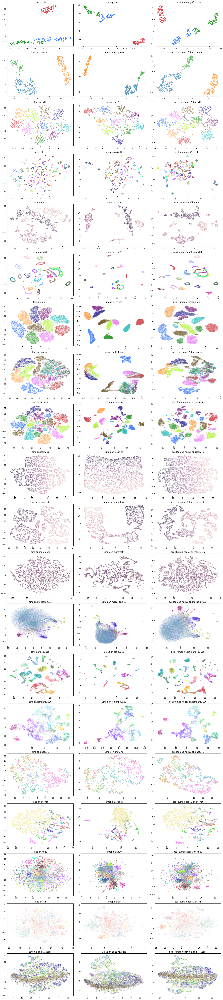

In [31]:
recall_exp.plot(methods=["tsne", "umap", "pca+tumap-neg50"])

Overall the `pca+tumap-neg50` resemble the `tsne` results more, but I also see some clusters being broken up, so it's not always a very appealing look. This is the sort of thing you would expect with t-SNE without early exaggeration so it looks like UMAP suffers from this too. The default spectral embedding is supposed to [approximate the result of early exaggeration](https://arxiv.org/abs/1706.02582) so perhaps spectral initialization is the way to go with UMAP with larger values of `negative_sample_rate`? Let's give it a go.

In [32]:
recall_exp.add_method(
    "umap", params=dict(a=1, b=1, negative_sample_rate=50), name="tumap-neg50"
)
recall_exp.run()

[16:07:16] INFO     Running tumap-neg50 on iris                                                    ]8;id=612862;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=117254;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:07:19] WARNING  151 nearest neighbors requested but only 150 items are available                  ]8;id=753586;file:///home/james/dev/drnb/src/drnb/eval/nbrpres.py\nbrpres.py]8;;\:]8;id=466473;file:///home/james/dev/drnb/src/drnb/eval/nbrpres.py#56\56]8;;\

           INFO     Running tumap-neg50 on penguins                                                ]8;id=602126;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=905021;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:07:22] INFO     Running tumap-neg50 on s1k                                                     ]8;id=195713;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=672289;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:07:29] INFO     Running tumap-neg50 on olivetti                                                ]8;id=889389;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=216870;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:07:33] INFO     Running tumap-neg50 on frey                                                    ]8;id=983169;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=811207;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:07:42] INFO     Running tumap-neg50 on coil20                                                  ]8;id=604340;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=710242;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:07:51] INFO     Running tumap-neg50 on mnist                                                   ]8;id=366420;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=335245;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:10:02] INFO     Running tumap-neg50 on fashion                                                 ]8;id=681008;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=24495;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:12:19] INFO     Running tumap-neg50 on kuzushiji                                               ]8;id=997418;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=730807;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:14:32] INFO     Running tumap-neg50 on isoswiss                                                ]8;id=578912;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=639391;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:15:09] INFO     Running tumap-neg50 on scurvehole                                              ]8;id=795042;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=475363;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:15:49] INFO     Running tumap-neg50 on mammoth                                                 ]8;id=318021;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=686485;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:18:15] INFO     Running tumap-neg50 on macosko2015                                             ]8;id=958346;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=124136;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:19:52] INFO     Running tumap-neg50 on tasic2018                                               ]8;id=901303;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=688980;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

/home/james/dev/drnb/venv/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


[16:20:53] INFO     Running tumap-neg50 on lamanno2020                                             ]8;id=357147;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=53369;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:21:13] INFO     Running tumap-neg50 on onet271                                                 ]8;id=213934;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=122404;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:21:19] INFO     Running tumap-neg50 on avonet                                                  ]8;id=380952;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=576309;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:21:38] INFO     Running tumap-neg50 on ng20                                                    ]8;id=662054;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=244427;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:22:17] INFO     Running tumap-neg50 on iclr                                                    ]8;id=777626;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=709264;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:22:46] INFO     Running tumap-neg50 on galaxy10sdss                                            ]8;id=67072;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=301085;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

In [33]:
recall_exp.to_df(
    metrics=["nnp-15"],
    methods=[
        "tsne",
        "umap",
        "pca+tumap-neg50",
        "tumap-neg50",
    ],
).agg("mean")

method           metric
tsne             nnp-15    0.486004
umap             nnp-15    0.395526
pca+tumap-neg50  nnp-15    0.442345
tumap-neg50      nnp-15    0.443355
dtype: float64

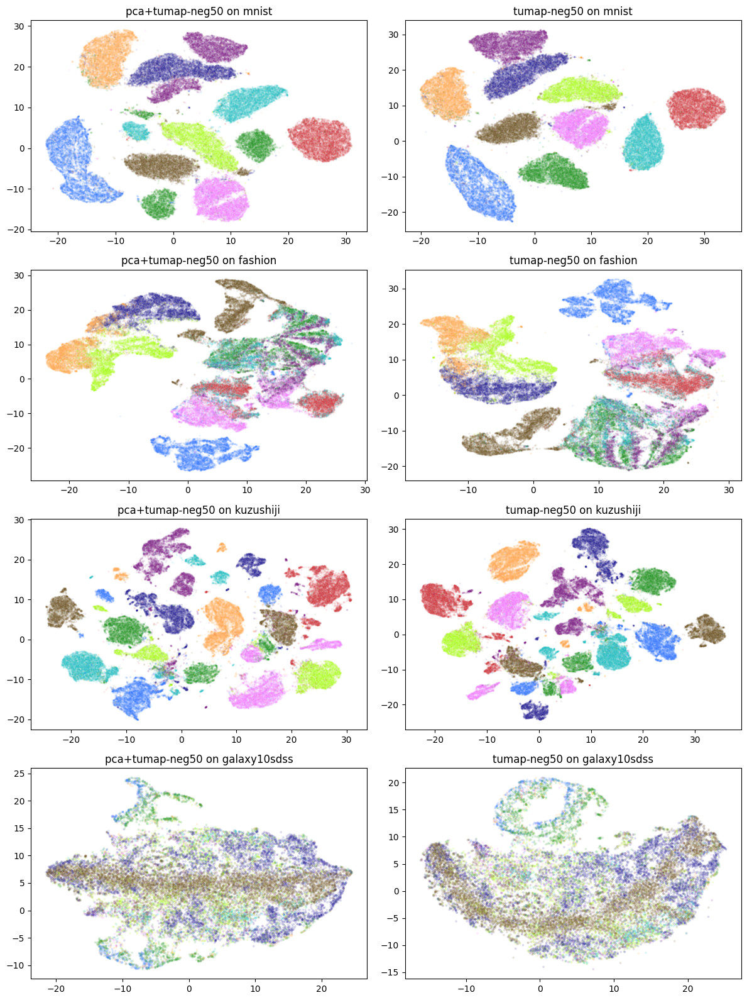

In [34]:
recall_exp.plot(
    methods=["pca+tumap-neg50", "tumap-neg50"],
    datasets=["mnist", "fashion", "kuzushiji", "galaxy10sdss"],
)

Hmm, some clusters stay together better, but some are still affected just in a different way. Getting to diminishing returns here, but before I give up, maybe we need to "anneal" the increase in negative sampling rate? I'll split the default 200 epochs that UMAP uses into 4 steps of 50 each, increasing the negative sampling rate at each stage. Smaller datasets actually get 500 epochs by default, so that may also affect their recall, but I'm not expecting miracles with the recall here and I am more interested to see what the visual effect is on the larger datasets anyway.

In [35]:
recall_exp.add_method(
    [
        pl.embedder("umap", params=dict(a=1, b=1, negative_sample_rate=5, n_epochs=50)),
        pl.embedder(
            "umap", params=dict(a=1, b=1, negative_sample_rate=10, n_epochs=50)
        ),
        pl.embedder(
            "umap", params=dict(a=1, b=1, negative_sample_rate=20, n_epochs=50)
        ),
        pl.embedder(
            "umap", params=dict(a=1, b=1, negative_sample_rate=50, n_epochs=50)
        ),
    ],
    name="tumap-neg50-anneal",
)

In [36]:
recall_exp.run()

[16:24:02] INFO     Running tumap-neg50-anneal on iris                                             ]8;id=451976;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=929146;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:24:11] WARNING  151 nearest neighbors requested but only 150 items are available                  ]8;id=115053;file:///home/james/dev/drnb/src/drnb/eval/nbrpres.py\nbrpres.py]8;;\:]8;id=492230;file:///home/james/dev/drnb/src/drnb/eval/nbrpres.py#56\56]8;;\

           INFO     Running tumap-neg50-anneal on penguins                                         ]8;id=100134;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=263194;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:24:20] INFO     Running tumap-neg50-anneal on s1k                                              ]8;id=609778;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=609855;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:24:29] INFO     Running tumap-neg50-anneal on olivetti                                         ]8;id=945128;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=74163;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:24:37] INFO     Running tumap-neg50-anneal on frey                                             ]8;id=490367;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=718284;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:24:48] INFO     Running tumap-neg50-anneal on coil20                                           ]8;id=813740;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=579047;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:24:58] INFO     Running tumap-neg50-anneal on mnist                                            ]8;id=938096;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=651664;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:26:02] INFO     Running tumap-neg50-anneal on fashion                                          ]8;id=429522;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=177512;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:27:09] INFO     Running tumap-neg50-anneal on kuzushiji                                        ]8;id=458471;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=560494;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:28:15] INFO     Running tumap-neg50-anneal on isoswiss                                         ]8;id=529811;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=444932;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:28:40] INFO     Running tumap-neg50-anneal on scurvehole                                       ]8;id=955717;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=646303;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:28:54] INFO     Running tumap-neg50-anneal on mammoth                                          ]8;id=315002;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=609411;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:30:46] INFO     Running tumap-neg50-anneal on macosko2015                                      ]8;id=294155;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=22327;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:31:37] INFO     Running tumap-neg50-anneal on tasic2018                                        ]8;id=263377;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=125680;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

/home/james/dev/drnb/venv/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


[16:32:11] INFO     Running tumap-neg50-anneal on lamanno2020                                      ]8;id=788138;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=87857;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:32:23] INFO     Running tumap-neg50-anneal on onet271                                          ]8;id=811416;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=336916;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:32:32] INFO     Running tumap-neg50-anneal on avonet                                           ]8;id=461226;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=228221;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:32:48] INFO     Running tumap-neg50-anneal on ng20                                             ]8;id=362456;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=343705;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:33:12] INFO     Running tumap-neg50-anneal on iclr                                             ]8;id=538024;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=164964;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

[16:33:34] INFO     Running tumap-neg50-anneal on galaxy10sdss                                     ]8;id=971068;file:///home/james/dev/drnb/src/drnb/experiment.py\experiment.py]8;;\:]8;id=73468;file:///home/james/dev/drnb/src/drnb/experiment.py#57\57]8;;\

In [37]:
recall_exp.to_df(
    metrics=["nnp-15"],
    methods=[
        "tsne",
        "umap",
        "tumap-neg50",
        "tumap-neg50-anneal",
    ],
).agg("mean")

method              metric
tsne                nnp-15    0.486004
umap                nnp-15    0.395526
tumap-neg50         nnp-15    0.443355
tumap-neg50-anneal  nnp-15    0.397652
dtype: float64

Ok, well the results don't seem great based on the mean recall: they are noticeably worse. What do the visualizations look like?

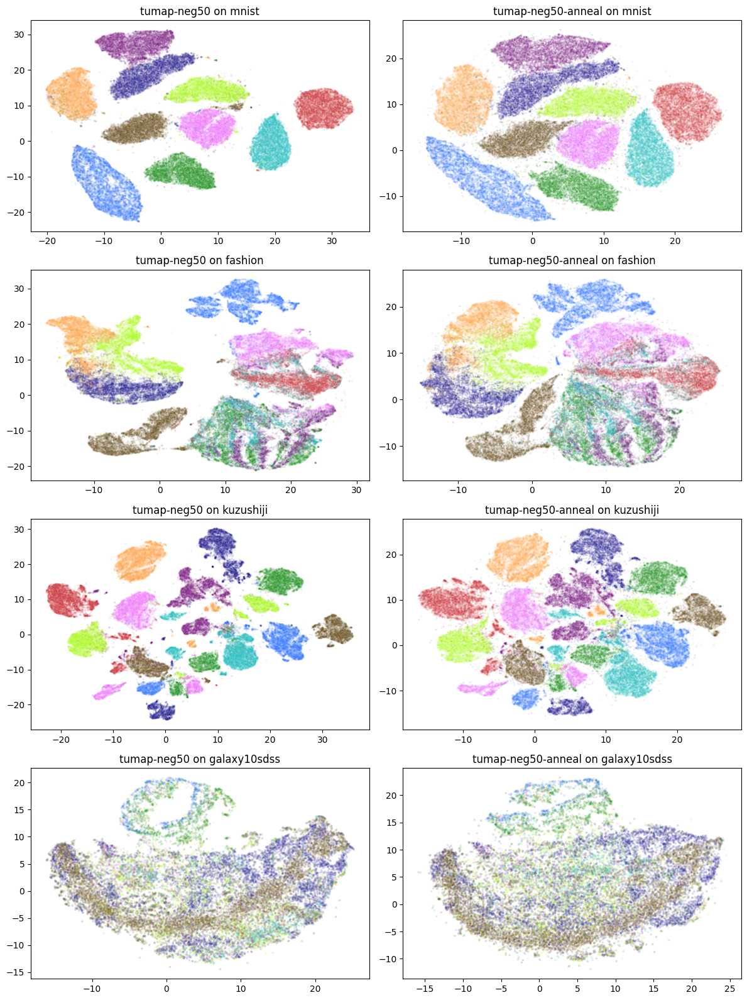

In [38]:
recall_exp.plot(
    methods=["tumap-neg50", "tumap-neg50-anneal"],
    datasets=["mnist", "fashion", "kuzushiji", "galaxy10sdss"],
)

I think they look slightly better with annealing, but the recall values don't seem to agree:

In [39]:
recall_exp.to_df(
    metrics=["nnp-15"],
    methods=[
        "tsne",
        "umap",
        "tumap-neg50",
        "tumap-neg50-anneal",
    ],
)

method,tsne,umap,tumap-neg50,tumap-neg50-anneal
metric,nnp-15,nnp-15,nnp-15,nnp-15
iris,0.827556,0.741778,0.768,0.744889
penguins,0.704678,0.660819,0.679727,0.620078
s1k,0.4122,0.366333,0.423467,0.370133
olivetti,0.515667,0.533833,0.5355,0.502167
frey,0.585988,0.534928,0.58246,0.54436
coil20,0.804815,0.756389,0.788981,0.729306
mnist,0.340412,0.11705,0.162811,0.140386
fashion,0.31666,0.129581,0.186594,0.15665
kuzushiji,0.333278,0.149741,0.204319,0.169356


Results just seem lower across the board, not just for datasets where we spent fewer epochs optimizing than before. Are the recalls for 50 neighbors any different?

In [40]:
recall_exp.to_df(
    metrics=["nnp-50"],
    methods=[
        "tsne",
        "umap",
        "tumap-neg50",
        "tumap-neg50-anneal",
    ],
)

method,tsne,umap,tumap-neg50,tumap-neg50-anneal
metric,nnp-50,nnp-50,nnp-50,nnp-50
iris,0.912,0.884,0.818933,0.7884
penguins,0.789708,0.764094,0.735497,0.732398
s1k,0.46008,0.46744,0.46028,0.43874
olivetti,0.5033,0.51865,0.48185,0.48045
frey,0.566443,0.548611,0.551654,0.53314
coil20,0.723917,0.708,0.666819,0.658361
mnist,0.325465,0.178874,0.21877,0.198644
fashion,0.334324,0.199178,0.255703,0.228621
kuzushiji,0.339768,0.218564,0.267915,0.239488


A similar story. Oh well. Maybe there is a better annealing scheme, but I am not very motivated to find it at this point.